# Lab02-Image Processing and Analysis


# 1. Chọn 1 ảnh từ internet bất kỳ và thực hiện các thao tác sau 
- Viết thành một function cho biết thông tin của bức ảnh : Ảnh màu hay ảnh xám và giá trị min max tương ứng với cừng kênh màu
- Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 
- Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 
- Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra
- Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra


# import thư viện

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pylab import imread
from skimage.color import rgb2gray
import cv2
from IPython.display import Image

- Viết thành một function cho biết thông tin của bức ảnh : Ảnh màu hay ảnh xám và giá trị min max tương ứng với từng kênh màu

Thông tin ảnh màu:
Kênh Blue:
Giá trị Min: 0, Giá trị Max: 255
Kênh Green:
Giá trị Min: 0, Giá trị Max: 255
Kênh Red:
Giá trị Min: 0, Giá trị Max: 255

Thông tin ảnh xám:
Giá trị Min: 0, Giá trị Max: 255


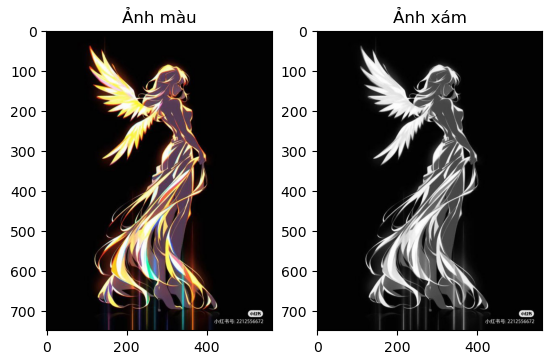

In [23]:
def analyze_and_display_images(image_path):
    # Đọc ảnh từ đường dẫn
    img = cv2.imread(image_path)
    
    # Chuyển đổi ảnh màu thành ảnh xám
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # In thông tin về ảnh màu
    print("Thông tin ảnh màu:")
    for channel in range(img.shape[2]):
        channel_name = ['Blue', 'Green', 'Red'][channel]
        min_val = np.min(img[:, :, channel])
        max_val = np.max(img[:, :, channel])
        print(f"Kênh {channel_name}:")
        print(f"Giá trị Min: {min_val}, Giá trị Max: {max_val}")

    # In thông tin về ảnh xám
    print("\nThông tin ảnh xám:")
    min_val_gray = np.min(gray_img)
    max_val_gray = np.max(gray_img)
    print(f"Giá trị Min: {min_val_gray}, Giá trị Max: {max_val_gray}")

    # Hiển thị ảnh màu và ảnh xám
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Ảnh màu')
    
    plt.subplot(1, 2, 2)
    plt.imshow(gray_img, cmap='gray')
    plt.title('Ảnh xám')
    
    plt.show()

# Đường dẫn đến ảnh màu
color_image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'

# In cả hai ảnh ra cùng với thông tin
analyze_and_display_images(color_image_path)


- Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 


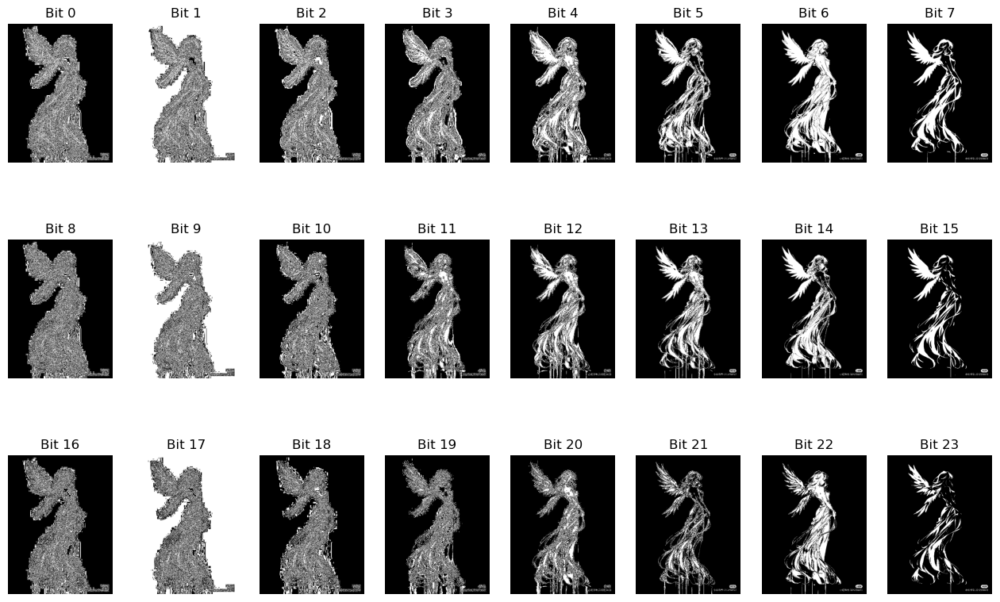

In [24]:
def show_bit_planes_with_matplotlib(image_path):
    try:
        # Đọc ảnh gốc
        image = cv2.imread(image_path)

        # Tách các kênh màu (R, G, B)
        b, g, r = cv2.split(image)

        # List chứa tất cả các kênh màu (R0-R7, G0-G7, B0-B7)
        bit_planes = []

        for channel in [r, g, b]:
            for bit in range(8):
                # Tạo mặt nạ để lấy từng bit riêng lẻ
                bit_mask = 1 << bit
                bit_plane = (channel & bit_mask) * 255
                bit_planes.append(bit_plane)

        # Hiển thị tất cả các ảnh bit bằng matplotlib với 8 cột và 3 dòng
        num_bit_planes = len(bit_planes)
        num_columns = 8
        num_rows = 3

        plt.figure(figsize=(16, 10))
        for i, bit_plane in enumerate(bit_planes):
            plt.subplot(num_rows, num_columns, i + 1)
            plt.imshow(bit_plane, cmap='gray')
            plt.title(f'Bit {i}')
            plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh bạn muốn hiển thị bit planes
image_path = r'C:\Users\Quynh Nhu\Downloads\.ipynb_checkpoints\imgforlab21.jpg'

# Gọi hàm để hiển thị bit planes bằng matplotlib
show_bit_planes_with_matplotlib(image_path)


- Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 

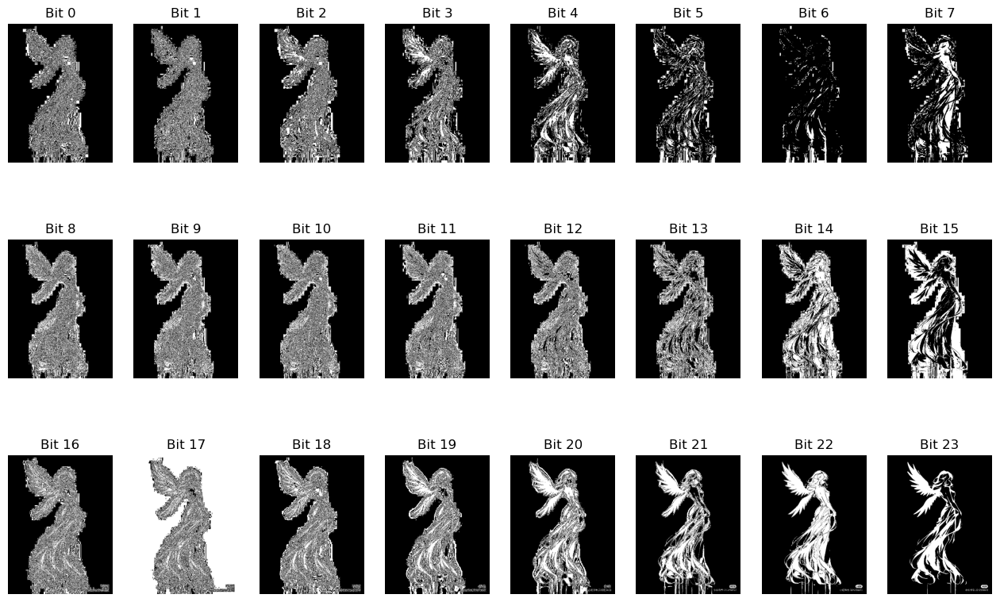

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def show_hsv_bit_planes(image_path):
    try:
        # Đọc ảnh gốc
        image = cv2.imread(image_path)

        # Chuyển đổi sang không gian màu HSV
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        # Tách các kênh màu (H, S, V)
        h, s, v = cv2.split(hsv_image)

        # List chứa tất cả các kênh màu (H0-H7, S0-S7, V0-V7)
        bit_planes = []

        for channel in [h, s, v]:
            for bit in range(8):
                # Tạo mặt nạ để lấy từng bit riêng lẻ
                bit_mask = 1 << bit
                bit_plane = (channel & bit_mask) * 255
                bit_planes.append(bit_plane)

        # Hiển thị tất cả các ảnh bit bằng matplotlib với 8 cột và 3 dòng
        num_bit_planes = len(bit_planes)
        num_columns = 8
        num_rows = 3

        plt.figure(figsize=(16, 10))
        for i, bit_plane in enumerate(bit_planes):
            plt.subplot(num_rows, num_columns, i + 1)
            plt.imshow(bit_plane, cmap='gray')
            plt.title(f'Bit {i}')
            plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh bạn muốn hiển thị bit planes
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'

# Gọi hàm để hiển thị bit planes của không gian màu HSV
show_hsv_bit_planes(image_path)


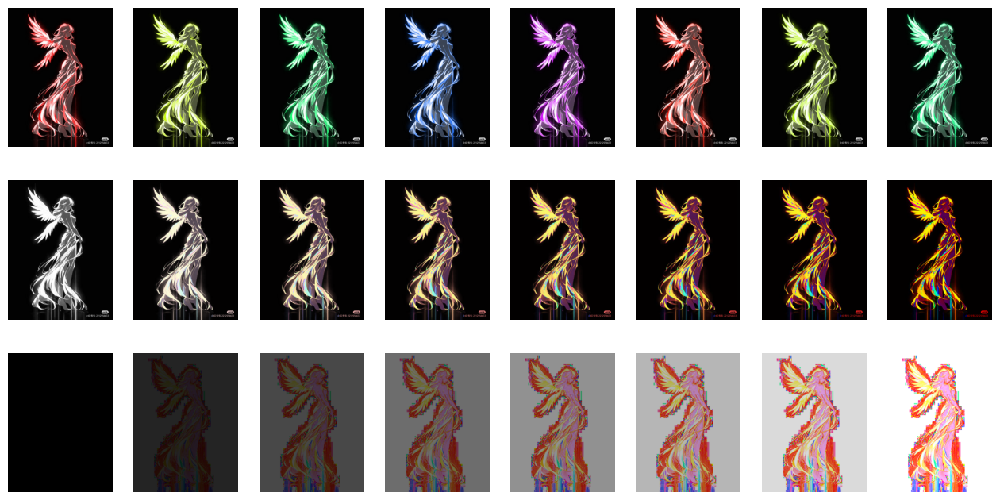

In [26]:
def split_hsv_channels_and_display(image_path):
    # Đọc hình ảnh gốc
    image = cv2.imread(image_path)

    # Chuyển hình ảnh sang không gian màu HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Tách thành từng kênh màu H, S, và V
    h, s, v = cv2.split(hsv_image)

    # Hiển thị 8 ảnh cho từng kênh màu H, S, V
    plt.figure(figsize=(16,8))

    # Kênh màu H (Hue)
    for i in range(8):
        plt.subplot(3, 8, i + 1)
        hue_channel = np.zeros_like(h)
        hue_channel.fill(255 * i / 7)
        colored_hue = cv2.merge((hue_channel, s, v))
        rgb_hue = cv2.cvtColor(colored_hue, cv2.COLOR_HSV2RGB)
        plt.imshow(rgb_hue)
        plt.axis('off')

    # Kênh màu S (Saturation)
    for i in range(8):
        plt.subplot(3, 8, 8 + i + 1)
        s_channel = np.zeros_like(s)
        s_channel.fill(255 * i / 7)
        colored_s = cv2.merge((h, s_channel, v))
        rgb_s = cv2.cvtColor(colored_s, cv2.COLOR_HSV2RGB)
        plt.imshow(rgb_s)
        plt.axis('off')

    # Kênh màu V (Value)
    for i in range(8):
        plt.subplot(3, 8, 16 + i + 1)
        v_channel = np.zeros_like(v)
        v_channel.fill(255 * i / 7)
        colored_v = cv2.merge((h, s, v_channel))
        rgb_v = cv2.cvtColor(colored_v, cv2.COLOR_HSV2RGB)
        plt.imshow(rgb_v)
        plt.axis('off')

    plt.show()

# Sử dụng hàm để hiển thị 24 bức ảnh theo từng kênh màu H, S, V
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'
split_hsv_channels_and_display(image_path)


- Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

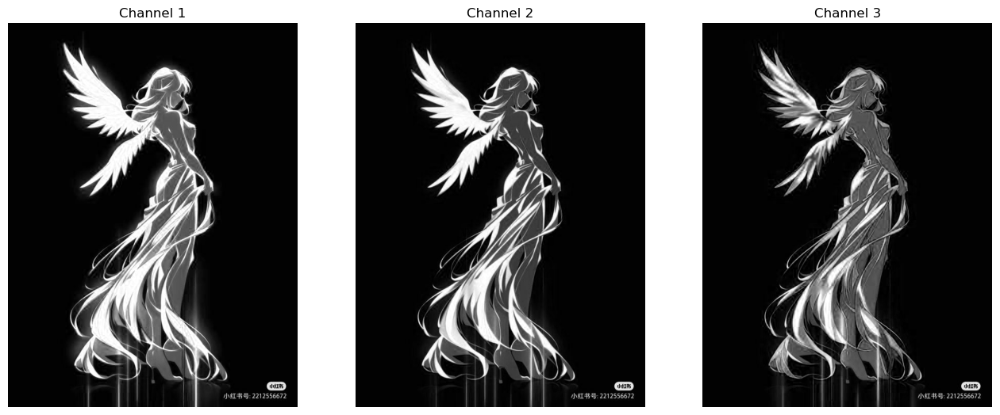

In [27]:
def display_high_contrast_bits(image_path):
    try:
        # Đọc ảnh gốc
        image = cv2.imread(image_path)

        # Tách các kênh màu (R, G, B)
        b, g, r = cv2.split(image)

        # Tìm các kênh màu (R, G, B) có độ tương phản cao
        high_contrast_channels = []

        for channel in [r, g, b]:
            if np.std(channel) > 10:  # Điều này có thể được điều chỉnh tùy thuộc vào mức độ độ tương phản bạn quan tâm
                high_contrast_channels.append(channel)

        # Hiển thị các kênh màu có độ tương phản cao
        plt.figure(figsize=(16,8))
        for i, channel in enumerate(high_contrast_channels):
            plt.subplot(1, len(high_contrast_channels), i + 1)
            plt.imshow(channel, cmap='gray')
            plt.title(f'Channel {i + 1}')
            plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh bạn muốn kiểm tra độ tương phản
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'

# Gọi hàm để hiển thị các kênh màu có độ tương phản cao
display_high_contrast_bits(image_path)


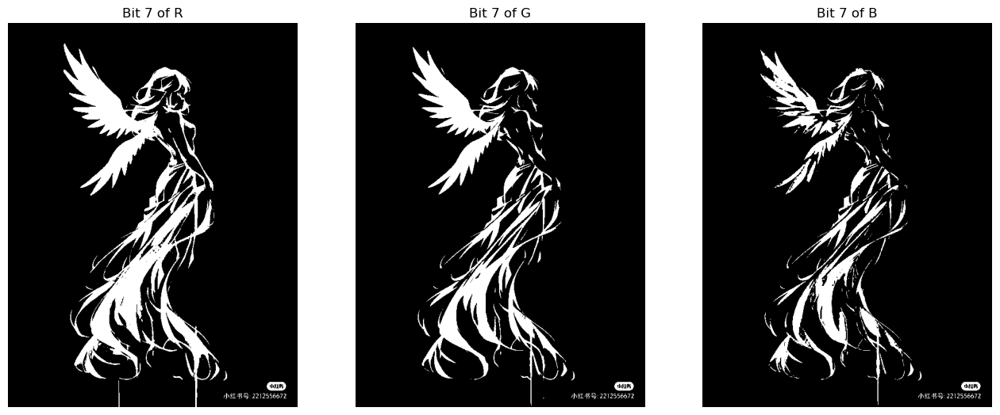

In [28]:
def show_specific_bits(image_path):
    try:
        # Đọc ảnh gốc
        image = cv2.imread(image_path)

        # Tách các kênh màu (R, G, B)
        b, g, r = cv2.split(image)

        # Trích xuất bit cụ thể từ mỗi kênh màu
        bit_mask_R = 1 << 7
        bit_mask_G = 1 << 7
        bit_mask_B = 1 << 7

        bit_plane_R = (r & bit_mask_R) * 255
        bit_plane_G = (g & bit_mask_G) * 255
        bit_plane_B = (b & bit_mask_B) * 255

        # Hiển thị ảnh bit cụ thể
        plt.figure(figsize=(16,8))
        plt.subplot(131)
        plt.imshow(bit_plane_R, cmap='gray')
        plt.title('Bit 7 of R')
        plt.axis('off')
        plt.subplot(132)
        plt.imshow(bit_plane_G, cmap='gray')
        plt.title('Bit 7 of G')
        plt.axis('off')
        plt.subplot(133)
        plt.imshow(bit_plane_B, cmap='gray')
        plt.title('Bit 7 of B')
        plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh bạn muốn hiển thị bit cụ thể
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'

# Gọi hàm để hiển thị bit cụ thể
show_specific_bits(image_path)


- Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra


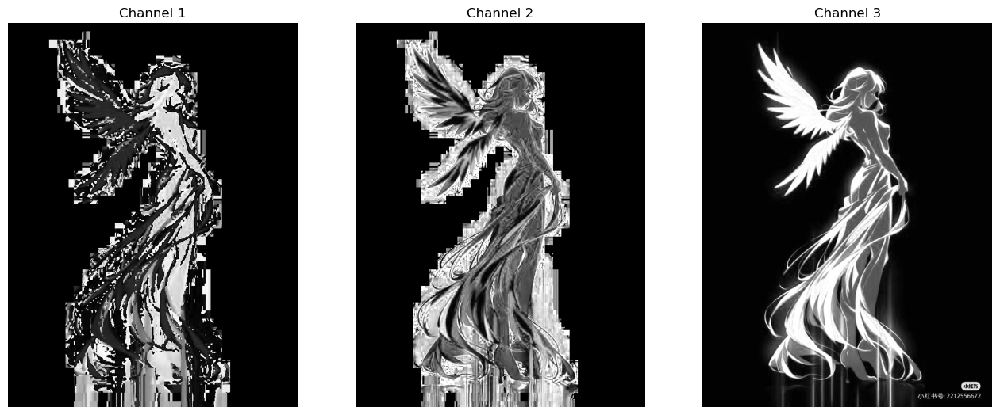

In [29]:
def display_high_contrast_bits(image_path):
    try:
        # Đọc ảnh gốc
        image = cv2.imread(image_path)

        # Chuyển đổi sang không gian màu HSV
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        # Tách các kênh màu (H, S, V)
        h, s, v = cv2.split(hsv_image)

        # Tìm các kênh màu (H, S, V) có độ tương phản cao
        high_contrast_channels = []

        for channel in [h, s, v]:
            if np.std(channel) > 50:  # Điều này có thể được điều chỉnh tùy thuộc vào mức độ độ tương phản bạn quan tâm
                high_contrast_channels.append(channel)

        # Hiển thị các kênh màu có độ tương phản cao
        plt.figure(figsize=(16,8))
        for i, channel in enumerate(high_contrast_channels):
            plt.subplot(1, len(high_contrast_channels), i + 1)
            plt.imshow(channel, cmap='gray')
            plt.title(f'Channel {i + 1}')
            plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh bạn muốn kiểm tra độ tương phản
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'

# Gọi hàm để hiển thị các kênh màu có độ tương phản cao
display_high_contrast_bits(image_path)


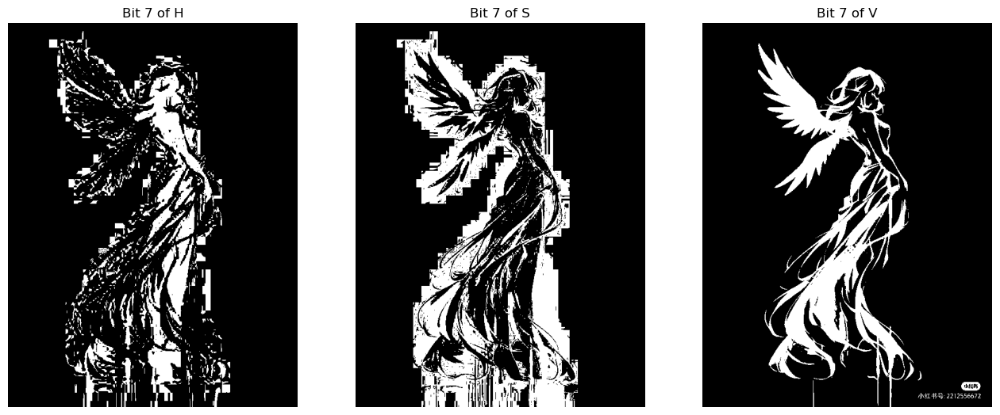

In [30]:
def display_specific_bits(image_path):
    try:
        # Đọc ảnh gốc
        image = cv2.imread(image_path)

        # Chuyển đổi sang không gian màu HSV
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        # Tách các kênh màu (H, S, V)
        h, s, v = cv2.split(hsv_image)

        # Trích xuất bit cụ thể từ mỗi kênh màu
        bit_mask_H = 1 << 7
        bit_mask_S = 1 << 7
        bit_mask_V = 1 << 7

        bit_plane_H = (h & bit_mask_H) * 255
        bit_plane_S = (s & bit_mask_S) * 255
        bit_plane_V = (v & bit_mask_V) * 255

        # Hiển thị ảnh bit cụ thể
        plt.figure(figsize=(16,8))
        plt.subplot(131)
        plt.imshow(bit_plane_H, cmap='gray')
        plt.title('Bit 7 of H')
        plt.axis('off')
        plt.subplot(132)
        plt.imshow(bit_plane_S, cmap='gray')
        plt.title('Bit 7 of S')
        plt.axis('off')
        plt.subplot(133)
        plt.imshow(bit_plane_V, cmap='gray')
        plt.title('Bit 7 of V')
        plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh bạn muốn hiển thị bit cụ thể
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab21.jpg'

# Gọi hàm để hiển thị bit cụ thể
display_specific_bits(image_path)


# 2. Chọn một bức ảnh có nhiều mặt người trên internet và thực hiện các thao tác sau 
- Viết 1 function input ảnh màu và xuất ảnh chân dung xám và chân dùng màu của ảnh đó 
- Tìm chọn range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu 


- Viết 1 function input ảnh màu và xuất ảnh chân dung xám và chân dùng màu của ảnh đó 

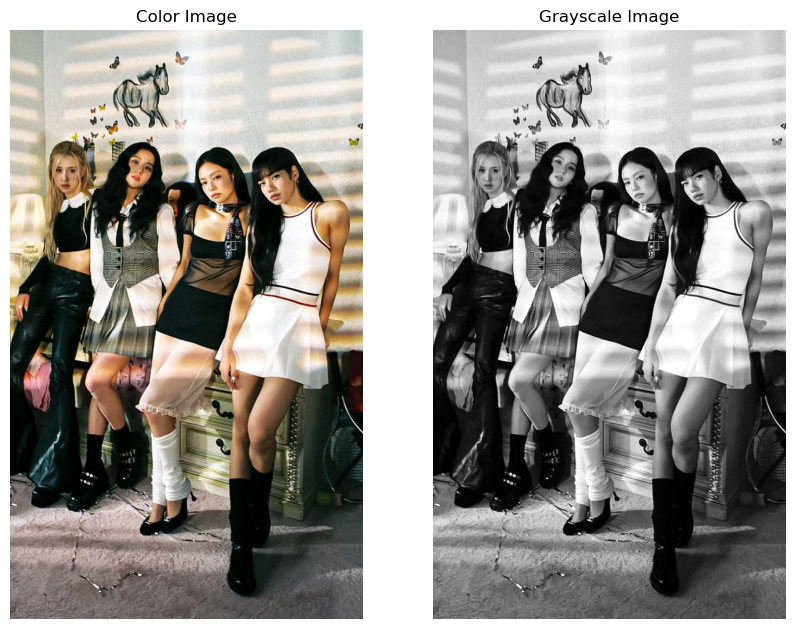

In [31]:
import cv2
import matplotlib.pyplot as plt

def convert_and_display_color_and_grayscale(image_path):
    try:
        # Đọc ảnh màu gốc
        color_image = cv2.imread(image_path)

        if color_image is not None:
            # Chuyển đổi sang ảnh xám
            grayscale_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

            # Hiển thị ảnh màu
            plt.figure(figsize=(10,8))
            plt.subplot(121)
            plt.imshow(cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB))
            plt.title('Color Image')
            plt.axis('off')

            # Hiển thị ảnh xám
            plt.subplot(122)
            plt.imshow(grayscale_image, cmap='gray')
            plt.title('Grayscale Image')
            plt.axis('off')

            plt.show()
        else:
            print("Không thể đọc ảnh màu.")

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh màu (đã được cung cấp)
input_image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab22.jpg'

# Gọi hàm để chuyển đổi và hiển thị ảnh màu và ảnh xám
convert_and_display_color_and_grayscale(input_image_path)


- Tìm chọn range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu 

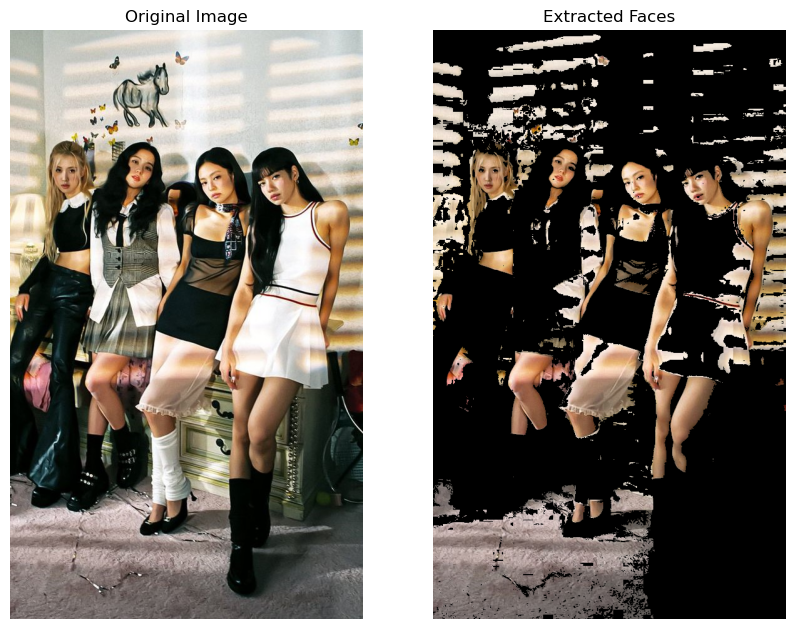

In [32]:
def extract_and_display_faces(image_path, lower_range, upper_range):
    try:
        # Đọc ảnh màu gốc
        image = cv2.imread(image_path)

        if image is not None:
            # Chuyển đổi ảnh sang không gian màu HSV
            hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

            # Tạo mặt nạ (mask) cho khoảng màu của khuôn mặt
            mask = cv2.inRange(hsv_image, lower_range, upper_range)

            # Áp dụng mặt nạ lên ảnh màu gốc
            result_image = cv2.bitwise_and(image, image, mask=mask)

            # Hiển thị ảnh màu gốc và ảnh sau khi trích xuất khuôn mặt
            plt.figure(figsize=(10,8))
            plt.subplot(121)
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(122)
            plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
            plt.title('Extracted Faces')
            plt.axis('off')

            plt.show()
        else:
            print("Không thể đọc ảnh màu.")

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh màu (đã được cung cấp)
input_image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab22.jpg'

# Định rõ khoảng màu cho khuôn mặt (ví dụ: dựa trên giá trị HSV)
# Vui lòng điều chỉnh giá trị dưới đây để phù hợp với màu da trên ảnh cụ thể
lower_range = np.array([0, 20, 90], dtype=np.uint8)
upper_range = np.array([20, 255, 255], dtype=np.uint8)

# Gọi hàm để trích xuất và hiển thị khuôn mặt
extract_and_display_faces(input_image_path, lower_range, upper_range)


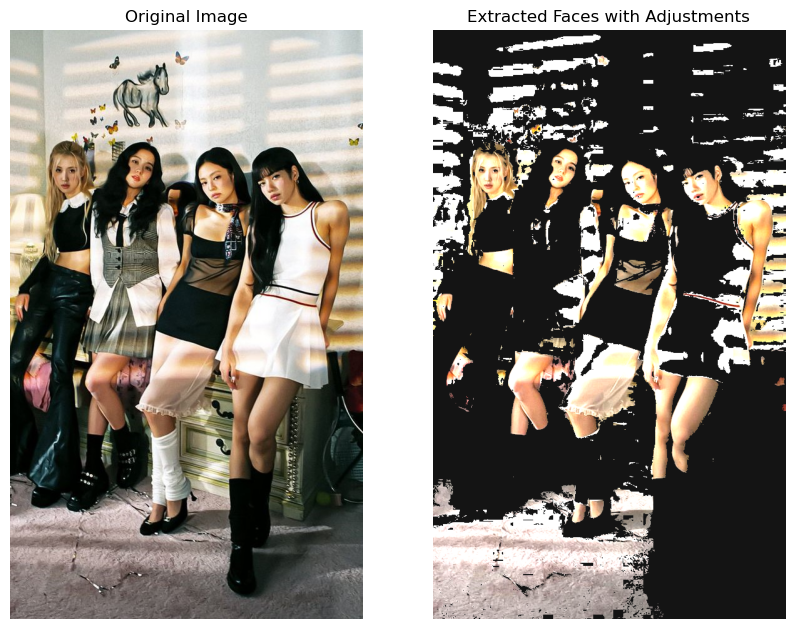

In [33]:
def extract_and_display_faces_with_adjustments(image_path, lower_range, upper_range, gamma=1.2, gain=0.9):
    try:
        # Đọc ảnh màu gốc
        image = cv2.imread(image_path)

        if image is not None:
            # Chuyển đổi ảnh sang không gian màu HSV
            hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

            # Tạo mặt nạ (mask) cho khoảng màu của khuôn mặt
            mask = cv2.inRange(hsv_image, lower_range, upper_range)

            # Áp dụng mặt nạ lên ảnh màu gốc
            result_image = cv2.bitwise_and(image, image, mask=mask)

            # Áp dụng điều chỉnh gamma và gain cho ảnh kết quả
            result_image = cv2.convertScaleAbs(result_image, alpha=gamma, beta=gain)

            # Hiển thị ảnh màu gốc và ảnh sau khi trích xuất khuôn mặt với điều chỉnh
            plt.figure(figsize=(10,8))
            plt.subplot(121)
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.axis('off')

            plt.subplot(122)
            plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
            plt.title('Extracted Faces with Adjustments')
            plt.axis('off')

            plt.show()
        else:
            print("Không thể đọc ảnh màu.")

    except Exception as e:
        print(f"Lỗi: {str(e)}")

# Đường dẫn đến ảnh màu (đã được cung cấp)
input_image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab22.jpg'

# Định rõ khoảng màu cho khuôn mặt (ví dụ: dựa trên giá trị HSV)
# Vui lòng điều chỉnh giá trị dưới đây để phù hợp với màu da trên ảnh cụ thể
lower_range = np.array([0, 20, 70], dtype=np.uint8)
upper_range = np.array([20, 255, 255], dtype=np.uint8)

# Gọi hàm để trích xuất và hiển thị khuôn mặt với điều chỉnh gamma và gain
extract_and_display_faces_with_adjustments(input_image_path, lower_range, upper_range, gamma=1.5, gain=20)


# 3. Chọn một bức ảnh từ internet về 1 đồ vật và thực hiện các thao tác sau :
- Xuất ảnh xoay các góc 30,45,60 độ
- Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh
- Xuất ảnh inversion
- Xuất ảnh enhance contrast
- Xuất ảnh gamma và log enhancement 


- Xuất ảnh xoay các góc 30,45,60 độ

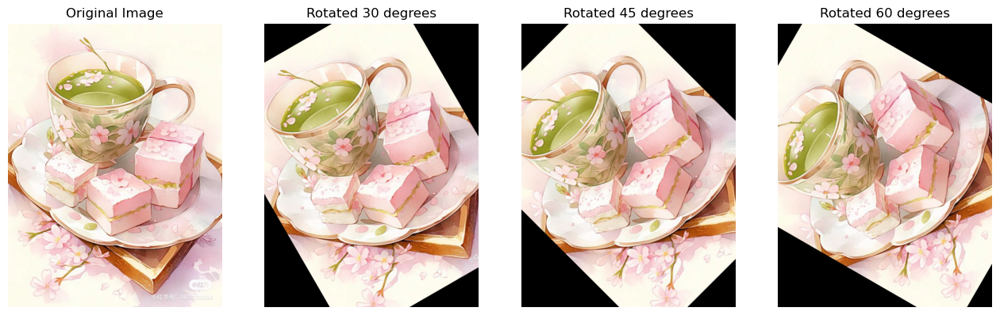

In [34]:
def rotate_image(image, angle):
    # Tính kích thước của ảnh gốc
    height, width = image.shape[:2]
    
    # Tính điểm trung tâm của ảnh
    center = (width // 2, height // 2)
    
    # Tạo ma trận quay
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Thực hiện phép quay ảnh
    rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
    
    return rotated_image

# Đường dẫn đến ảnh gốc
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab23.jpg'

# Đọc ảnh gốc
original_image = cv2.imread(image_path)

# Góc quay (30, 45, 60 độ)
angles = [30, 45, 60]

# Hiển thị ảnh gốc và ảnh sau khi quay hàng ngang
plt.figure(figsize=(16, 8))
plt.subplot(1, 4, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

for i, angle in enumerate(angles):
    rotated_image = rotate_image(original_image, angle)
    plt.subplot(1, 4, i + 2)
    plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Rotated {angle} degrees')
    plt.axis('off')

plt.show()


- Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh


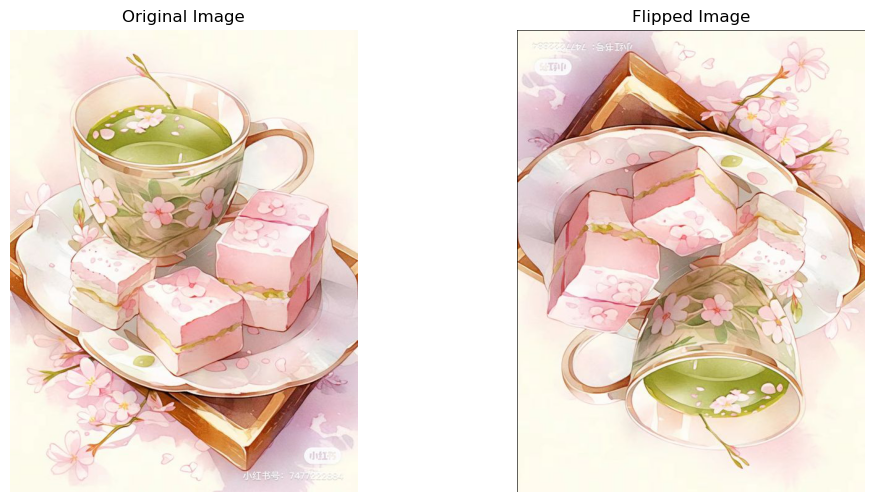

In [35]:
def flip_image(image):
    # Đọc kích thước ảnh
    height, width = image.shape[:2]
    
    # Tạo ma trận đối xứng qua trục hoành và trục tung đi qua tâm ảnh
    flip_matrix = np.array([[-1, 0, width], [0, -1, height]], dtype=np.float32)
    
    # Thực hiện phép đối xứng
    flipped_image = cv2.warpAffine(image, flip_matrix, (width, height))
    
    return flipped_image

# Đường dẫn đến ảnh gốc
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab23.jpg'

# Đọc ảnh gốc
original_image = cv2.imread(image_path)

# Đối xứng ảnh qua trục hoành và trục tung đi qua tâm ảnh
flipped_image = flip_image(original_image)

# Hiển thị ảnh gốc và ảnh đối xứng
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(flipped_image, cv2.COLOR_BGR2RGB))
plt.title('Flipped Image')
plt.axis('off')

plt.show()


- Xuất ảnh inversion

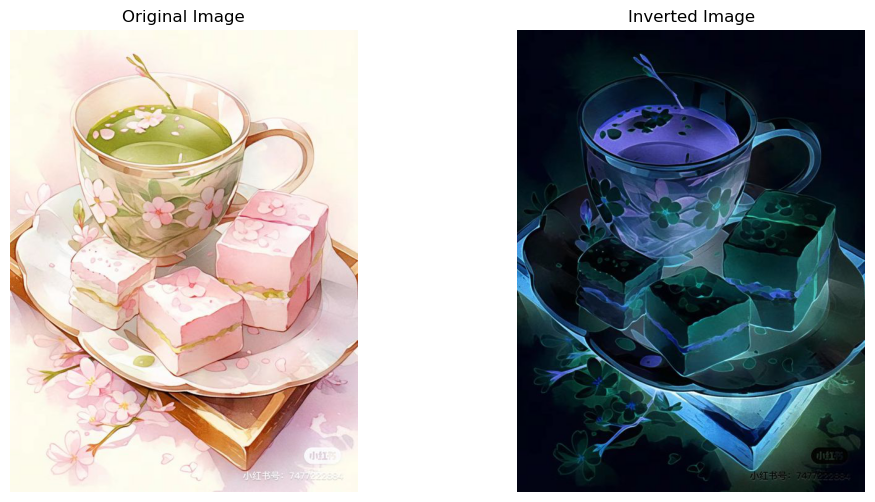

In [36]:
def invert_image(image):
    # Thực hiện phép nghịch đảo bằng cách trừ 255 cho giá trị màu của từng pixel
    inverted_image = 255 - image
    
    return inverted_image

# Đường dẫn đến ảnh gốc
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab23.jpg'

# Đọc ảnh gốc
original_image = cv2.imread(image_path)

# Tạo ảnh nghịch đảo
inverted_image = invert_image(original_image)

# Hiển thị ảnh gốc và ảnh nghịch đảo
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(inverted_image, cv2.COLOR_BGR2RGB))
plt.title('Inverted Image')
plt.axis('off')

plt.show()


- Xuất ảnh enhance contrast


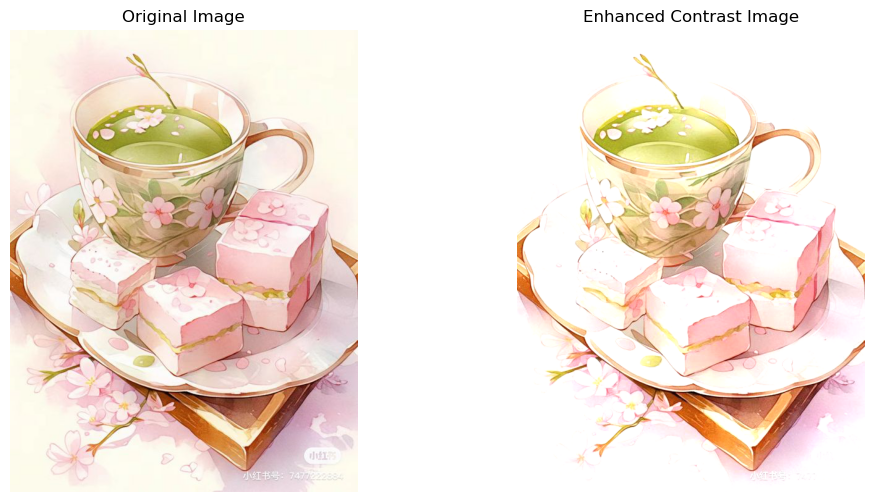

In [37]:
def enhance_contrast(image, alpha, beta):
    # Thực hiện phép tăng cường tương phản
    enhanced_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    
    return enhanced_image

# Đường dẫn đến ảnh gốc
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab23.jpg'

# Đọc ảnh gốc
original_image = cv2.imread(image_path)

# Tăng cường tương phản với alpha và beta tùy chỉnh
enhanced_image = enhance_contrast(original_image, alpha=1.2, beta=0.5)

# Hiển thị ảnh gốc và ảnh tăng cường tương phản
plt.figure(figsize=(12,6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
plt.title('Enhanced Contrast Image')
plt.axis('off')

plt.show()


- Xuất ảnh gamma và log enhancement 

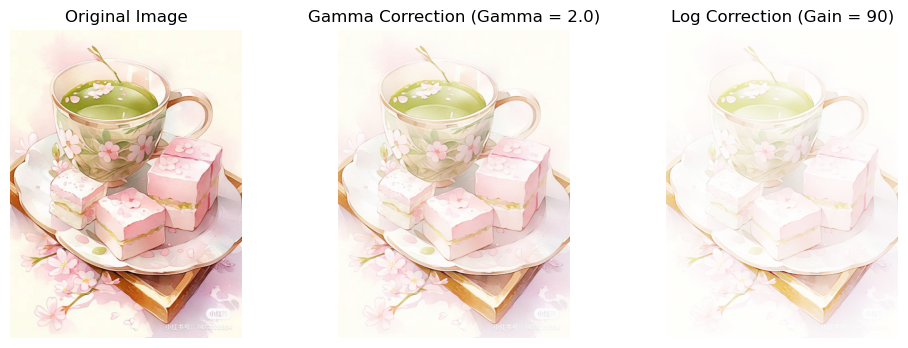

In [38]:
def gamma_correction(image, gamma):
    # Tăng cường gamma
    gamma_corrected = np.power(image / 255.0, 1.0 / gamma) * 255.0
    gamma_corrected = np.uint8(gamma_corrected)
    
    return gamma_corrected

def log_correction(image, gain):
    # Tăng cường log
    log_corrected = gain * np.log1p(image)
    log_corrected = np.uint8(255 * (log_corrected / np.max(log_corrected)))
    
    return log_corrected

# Đường dẫn đến ảnh gốc
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\imgforlab23.jpg'

# Đọc ảnh gốc
original_image = cv2.imread(image_path)

# Tăng cường gamma với giá trị gamma tùy chỉnh
gamma_value = 2.0
gamma_corrected = gamma_correction(original_image, gamma_value)

# Tăng cường log với gain tùy chỉnh
log_gain = 90
log_corrected = log_correction(original_image, log_gain)

# Hiển thị ảnh gốc, ảnh tăng cường gamma và ảnh tăng cường log
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(gamma_corrected, cv2.COLOR_BGR2RGB))
plt.title(f'Gamma Correction (Gamma = {gamma_value})')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(log_corrected, cv2.COLOR_BGR2RGB))
plt.title(f'Log Correction (Gain = {log_gain})')
plt.axis('off')

plt.show()


# LÀM THÊM


1. Phân loại ảnh dựa trên nội dung: Phát triển một hệ thống phân loại ảnh dựa trên nội dung, dự đoán nội dung của ảnh dựa trên học máy.
-  chúng ta sẽ sử dụng mô hình "MobileNetV2" pre-trained trên bộ dữ liệu ImageNet để phân loại ảnh thành các lớp khác nhau. Mô hình MobileNetV2 sẽ dự đoán lớp và xác suất của ảnh dựa trên bộ dữ liệu ImageNet.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 1s 552ms/step
Predicted class: giant_panda
Probability: 0.70


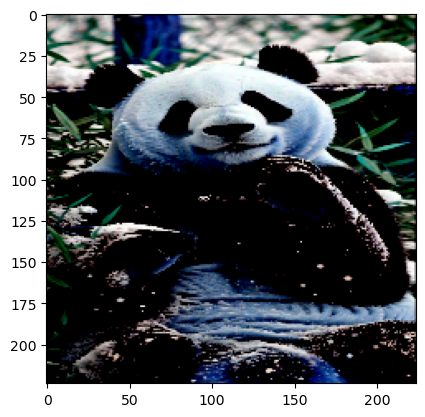

In [39]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input, decode_predictions

# Load pre-trained MobileNetV2 model
model = MobileNetV2(weights='imagenet')

# Load and preprocess the image
image_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\panda.jpg'
image = cv2.imread(image_path)
image = cv2.resize(image, (224, 224))
image = preprocess_input(image)
plt.imshow(image)

# Make predictions
predictions = model.predict(np.expand_dims(image, axis=0))
decoded_predictions = decode_predictions(predictions)

# Display the top predicted class and probability
top_prediction = decoded_predictions[0][0]
class_label = top_prediction[1]
probability = top_prediction[2]

print(f"Predicted class: {class_label}")
print(f"Probability: {probability:.2f}")


2. Image Style Transfer: Phát triển ứng dụng chuyển đổi phong cách ảnh, nơi bạn có thể chuyển đổi ảnh của bạn thành các phong cách nghệ thuật nổi tiếng.
- chúng ta sử dụng mô hình VGG19 để trích xuất đặc trưng từ hình ảnh. Sau đó, chúng ta tính toán mất mát dựa trên sự khác biệt giữa phong cách hình ảnh nguồn và hình ảnh mục tiêu. Chúng ta sử dụng tối ưu hóa Adam để điều chỉnh hình ảnh nguồn sao cho nó thể hiện phong cách của hình ảnh mục tiêu.
- Kết quả cuối cùng là một hình ảnh được chuyển đổi theo phong cách của hình ảnh mục tiêu. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


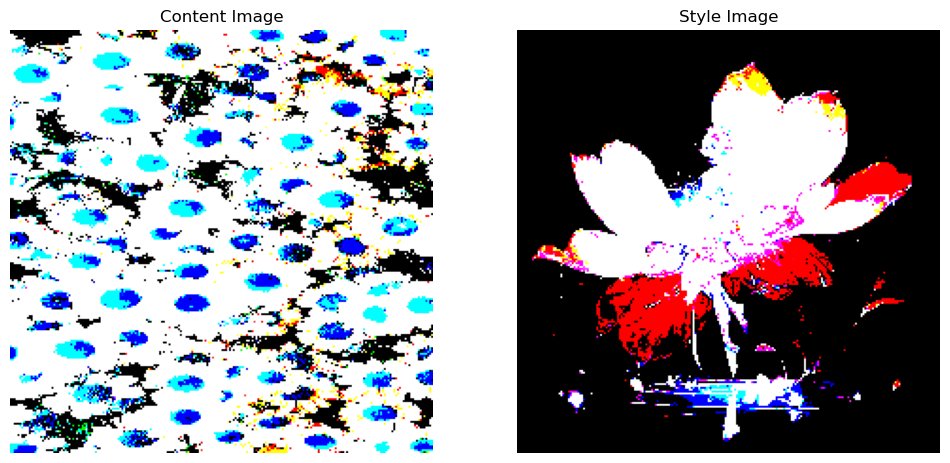

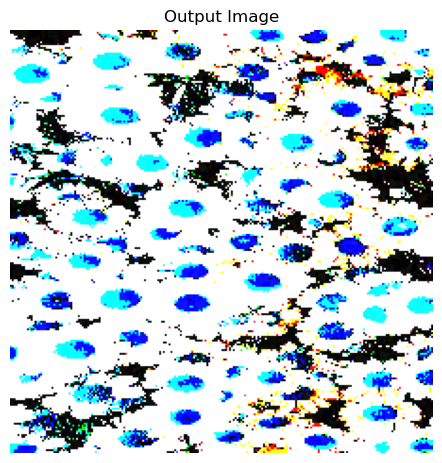

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


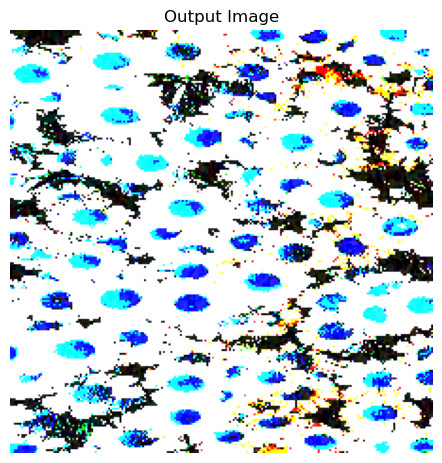

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


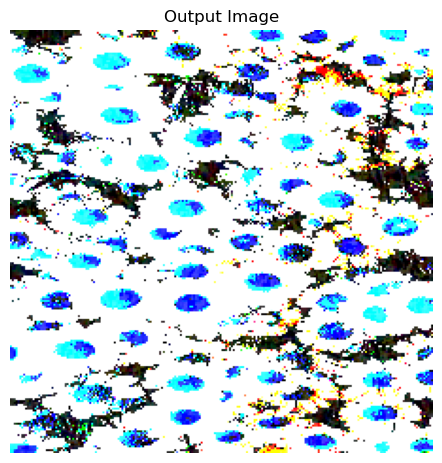

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


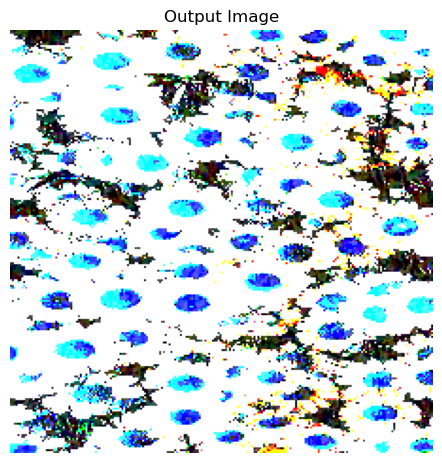

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


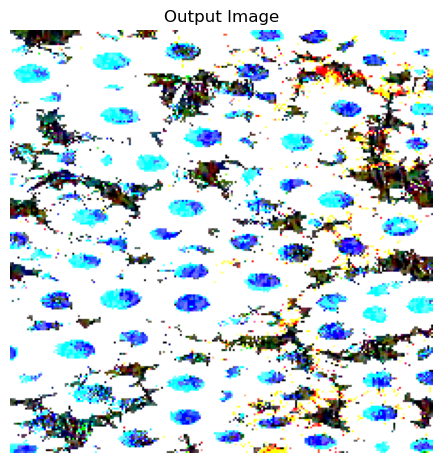

True

In [54]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG19
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model
from tensorflow.keras import layers

# Load and preprocess the content and style images
content_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\content.jpg'  # Đường dẫn đến hình ảnh nội dung
style_path = 'C:\\Users\\Quynh Nhu\\Downloads\\.ipynb_checkpoints\\style.jpg'      # Đường dẫn đến hình ảnh phong cách


def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224, 224))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

content_image = preprocess_image(content_path)
style_image = preprocess_image(style_path)

# Display the content and style images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(content_image[0])
plt.title('Content Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(style_image[0])
plt.title('Style Image')
plt.axis('off')

# Load VGG19 model and intermediate layers for feature extraction
model = VGG19(include_top=False, weights='imagenet')

# Define intermediate layers for feature extraction
content_layers = ['block5_conv2']
style_layers = [
    'block1_conv1',
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1'
]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

# Feature extraction model
def feature_extraction_model(layer_names):
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    outputs = [vgg.get_layer(name).output for name in layer_names]
    model = Model(inputs=[vgg.input], outputs=outputs)
    return model

# Gram matrix
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / (num_locations)

# Build style transfer model
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg = feature_extraction_model(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], outputs[self.num_style_layers:])
        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
        content_dict = {content_name: value for content_name, value in zip(self.content_layers, content_outputs)}
        style_dict = {style_name: value for style_name, value in zip(self.style_layers, style_outputs)}
        return {'content': content_dict, 'style': style_dict}

# Define and initialize the model
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

# Define and initialize the variables
image = tf.Variable(content_image)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

# Style transfer loop
style_weight = 1e-2
content_weight = 1e4

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2) for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2) for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=255.0))

# Run the style transfer
epochs = 5
steps_per_epoch = 5

for n in range(epochs):
    for m in range(steps_per_epoch):
        train_step(image)
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image.read_value()[0])
    plt.title('Output Image')
    plt.axis('off')
    plt.show()

# Save the stylized image
result_image = np.array(image.read_value()[0], dtype=np.uint8)
result_image = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)
cv2.imwrite('output_styled_image.jpg', result_image)
